In [24]:
import os
import pandas as pd
import cv2
import numpy as np
import tensorflow as tf
from random import shuffle
import matplotlib.pyplot as plt

In [7]:
DataMainPath = os.path.join(os.getcwd(), 'Data', 'CNNDatasets')
DataMainPath

'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets'

In [113]:
train_path = os.path.join(DataMainPath, 'seg_train')
test_path = os.path.join(DataMainPath, 'seg_test')
pred_path = os.path.join(DataMainPath, 'seg_pred')

In [14]:
print('Train Lables {}'.format(os.listdir(train_path)))
print('Test Lables {}'.format(os.listdir(test_path)))

Train Lables ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Test Lables ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


#### Loading Data

In [15]:
IMAGE_SIZE = (150, 150)

In [16]:
class_names = os.listdir(train_path)
class_names_labels = []

In [18]:
for index, item in enumerate(class_names):
    class_names_labels.append(index)

In [19]:
class_names, class_names_labels

(['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street'],
 [0, 1, 2, 3, 4, 5])

In [20]:
class_names.index('glacier')

2

In [21]:
train_images_path_list = []
for folder in os.listdir(train_path):
    lblPath = os.path.join(train_path, folder)
    imageInPathList = os.listdir(lblPath)
    for img in imageInPathList:
        imgFullPath = os.path.join(lblPath, img)
        img_label_obj = {'imgPath':imgFullPath, 'label':class_names.index(folder)}
        train_images_path_list.append(img_label_obj)

In [22]:
train_images_path_list[0]['imgPath']

'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\buildings\\0.jpg'

Text(0.5, 1.0, 'buildings')

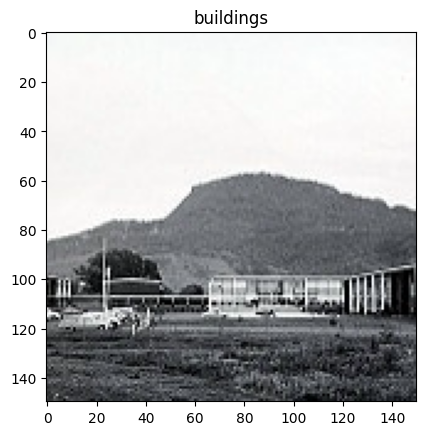

In [25]:
plt.imshow(cv2.imread(train_images_path_list[0]['imgPath']))
plt.title(class_names[train_images_path_list[0]['label']])

In [26]:
shuffle(train_images_path_list)
train_images_path_list[:5]

[{'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\mountain\\1887.jpg',
  'label': 3},
 {'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\glacier\\5566.jpg',
  'label': 2},
 {'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\street\\9717.jpg',
  'label': 5},
 {'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\forest\\18735.jpg',
  'label': 1},
 {'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\street\\2957.jpg',
  'label': 5}]

In [27]:
type(train_images_path_list), len(train_images_path_list)

(list, 14034)

In [28]:
train_images_path_after_shuffling = []
train_lables_path_after_shuffling = []
for i in range(len(train_images_path_list)):
    train_images_path_after_shuffling.append(train_images_path_list[i]['imgPath'])
    train_lables_path_after_shuffling.append(train_images_path_list[i]['label'])

In [29]:
len(train_images_path_after_shuffling), len(train_lables_path_after_shuffling)

(14034, 14034)

In [30]:
train_images_path_after_shuffling[:5], train_lables_path_after_shuffling[:5]

(['D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\mountain\\1887.jpg',
  'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\glacier\\5566.jpg',
  'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\street\\9717.jpg',
  'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\forest\\18735.jpg',
  'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_train\\street\\2957.jpg'],
 [3, 2, 5, 1, 5])

In [31]:
img = cv2.imread(train_images_path_after_shuffling[0])
img.shape

(150, 150, 3)

In [33]:
train_images = []
train_lables = train_lables_path_after_shuffling
for imgPath in train_images_path_after_shuffling:
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, dsize=(IMAGE_SIZE))
    img = img / 255
    train_images.append(img)

In [36]:
len(train_images), train_images[0].shape

(14034, (150, 150, 3))

#### Load Testing Data

In [37]:
test_images_path_list = []
for folder in os.listdir(test_path):
    lblPath = os.path.join(test_path, folder)
    imageInPathList = os.listdir(lblPath)
    for img in imageInPathList:
        imgFullPath = os.path.join(lblPath, img)
        img_label_obj = {'imgPath':imgFullPath, 'label':class_names.index(folder)}
        test_images_path_list.append(img_label_obj)

In [38]:
len(test_images_path_list)

3000

In [39]:
test_images_path_list[0]['imgPath']

'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_test\\buildings\\20057.jpg'

Text(0.5, 1.0, 'buildings')

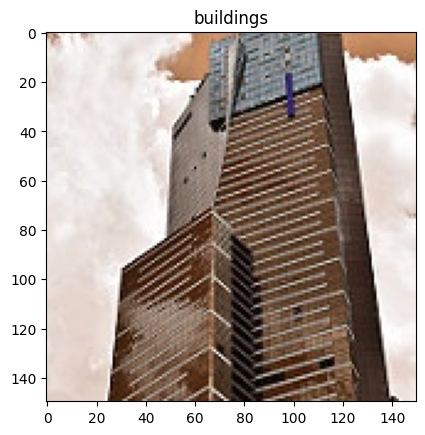

In [41]:
plt.imshow(cv2.imread(test_images_path_list[0]['imgPath']))
plt.title(class_names[test_images_path_list[0]['label']])

In [83]:
shuffle(test_images_path_list)
test_images_path_list[:5]

[{'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_test\\mountain\\22117.jpg',
  'label': 3},
 {'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_test\\buildings\\20777.jpg',
  'label': 0},
 {'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_test\\buildings\\20425.jpg',
  'label': 0},
 {'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_test\\sea\\24136.jpg',
  'label': 4},
 {'imgPath': 'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_test\\street\\20591.jpg',
  'label': 5}]

In [84]:
test_images_path_list_after_shuffling = []
test_lables_path_list_after_shuffling = []
for i in range(len(test_images_path_list)):
    test_images_path_list_after_shuffling.append(test_images_path_list[i]['imgPath'])
    test_lables_path_list_after_shuffling.append(test_images_path_list[i]['label'])

In [85]:
test_images = []
test_lables = test_lables_path_list_after_shuffling
for imgPath in test_images_path_list_after_shuffling:
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, dsize=(IMAGE_SIZE))
    img = img/ 255
    test_images.append(img)

In [46]:
len(test_images), len(test_lables)

(3000, 3000)

In [48]:
train_images[0].shape, test_images[0].shape

((150, 150, 3), (150, 150, 3))

#### Load Pred Image

'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_pred'

In [119]:
pred_images_path_list = []
for folder in os.listdir(pred_path):
    filePath = os.path.join(pred_path, folder)
    pred_images_path_list.append(filePath)
    # for img in imageInPathList:
    #     imgFullPath = os.path.join(lblPath, img)
    #     

In [124]:
pred_images_path_list[0]

'D:\\Shalgham\\DataScience\\envs\\kayfa_ml_eda\\Data\\CNNDatasets\\seg_pred\\10004.jpg'

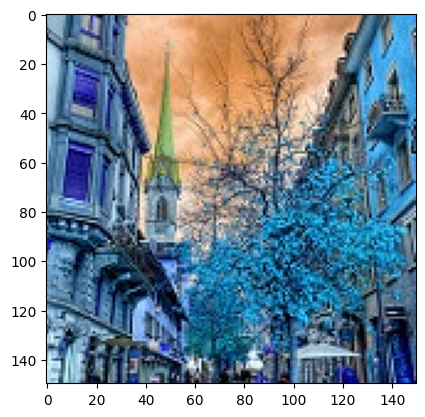

In [125]:
plt.imshow(cv2.imread(pred_images_path_list[0]))

In [126]:
pred_images = []
for imgPath in pred_images_path_list:
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, dsize=(IMAGE_SIZE))
    img = img/ 255
    pred_images.append(img)

In [127]:
pred_images[0].shape, pred_images[0].shape

((150, 150, 3), (150, 150, 3))

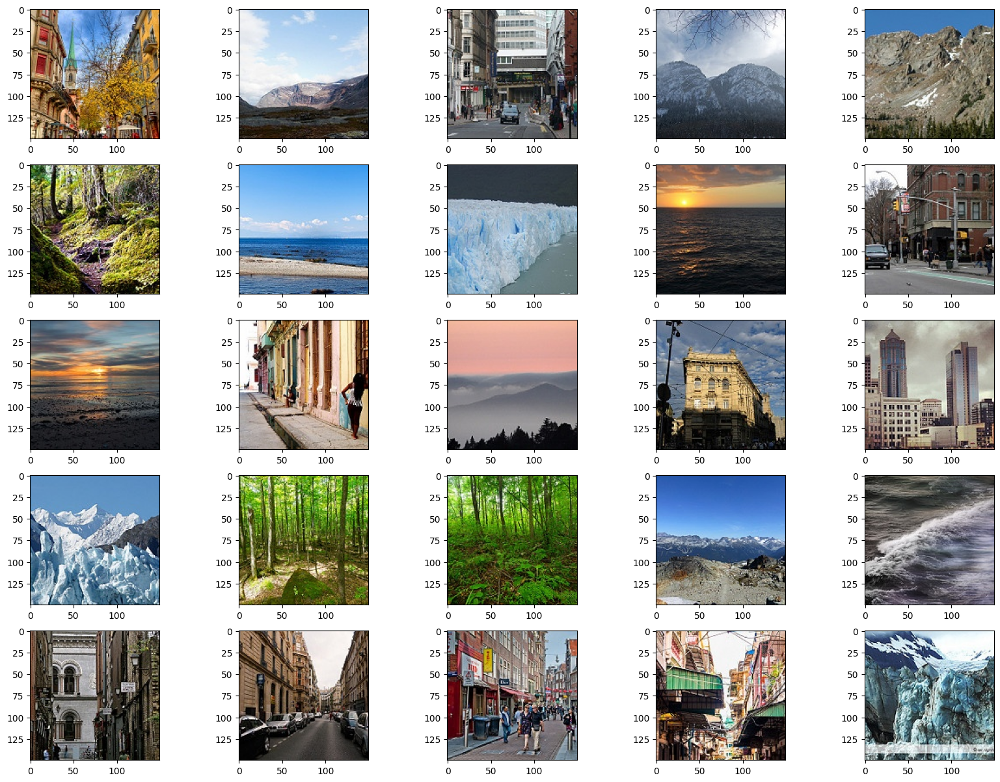

In [128]:
fig, axes = plt.subplots(5, 5, figsize=(20, 15))
axes = axes.ravel()
for idx, ax in enumerate(axes):
    ax.imshow(pred_images[idx])
plt.show()

#### Preview Sample Train

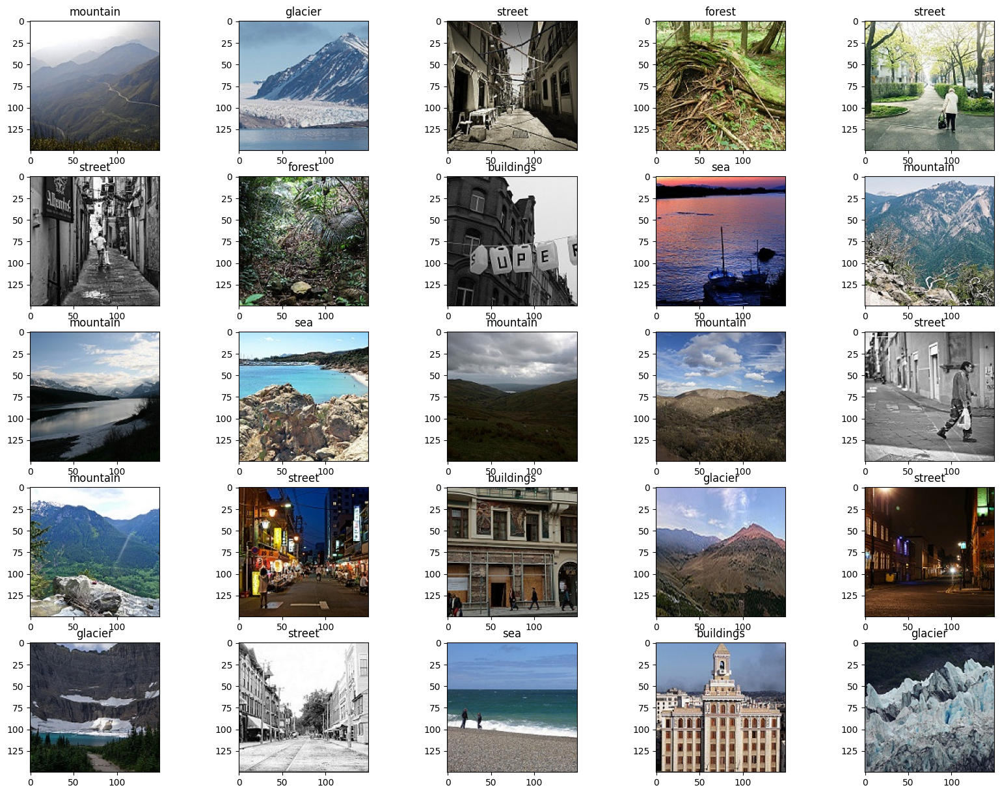

In [50]:
fig, axes = plt.subplots(5, 5, figsize=(20, 15))
axes = axes.ravel()
for idx, ax in enumerate(axes):
    ax.imshow(train_images[idx])
    ax.set_title(class_names[train_lables[idx]])

plt.show()

#### Preview Sample Test

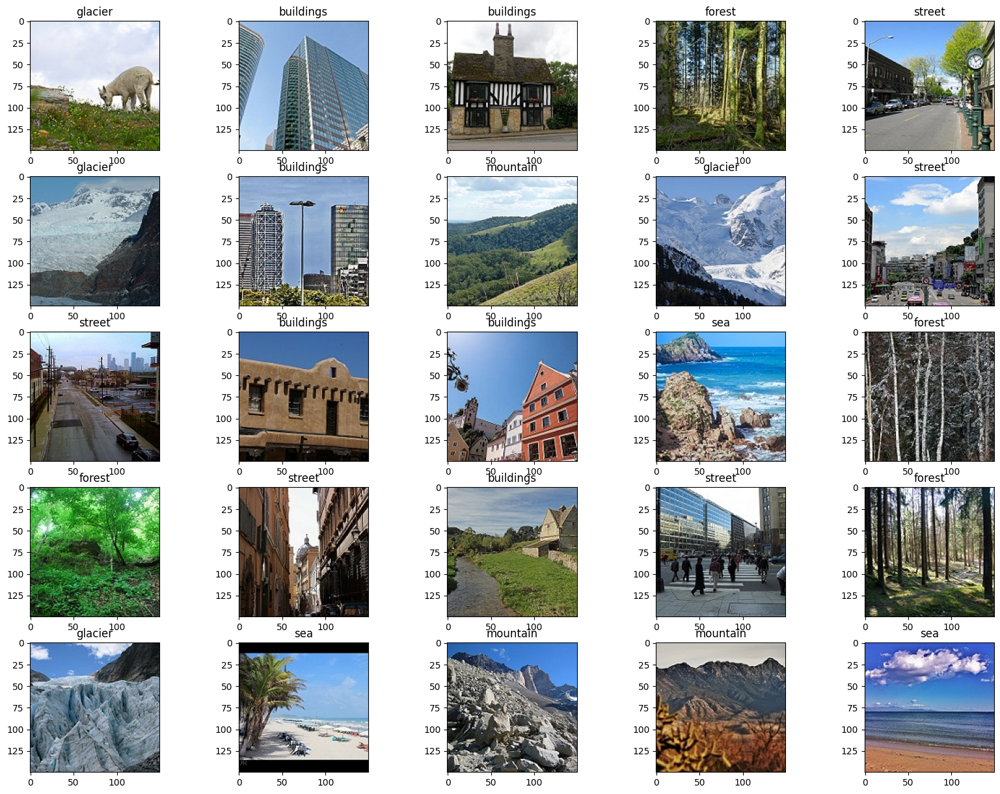

In [51]:
fig, axes = plt.subplots(5, 5, figsize=(20, 15))
axes = axes.ravel()
for idx, ax in enumerate(axes):
    ax.imshow(test_images[idx])
    ax.set_title(class_names[test_lables[idx]])

plt.show()

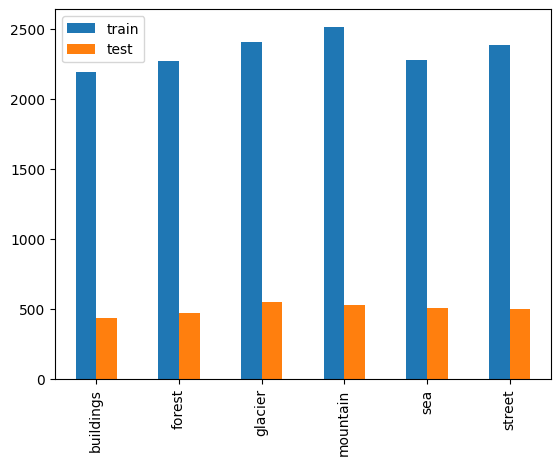

In [52]:
_, train_counts = np.unique(train_lables, return_counts=True)
_, test_counts = np.unique(test_lables, return_counts=True)
pd.DataFrame({'train': train_counts,
                    'test': test_counts}, 
             index=os.listdir(train_path)
            ).plot.bar()
plt.show()

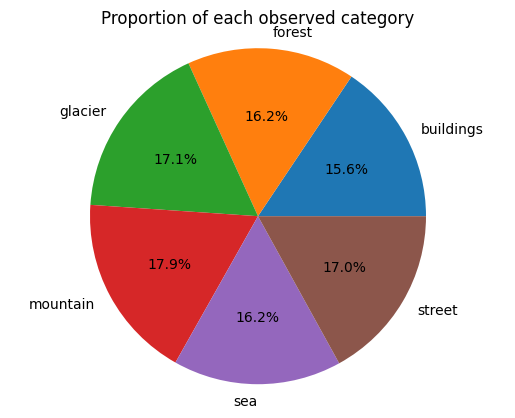

In [53]:
plt.pie(train_counts,
        explode=(0, 0, 0, 0, 0, 0) , 
        labels=os.listdir(train_path),
        autopct='%1.1f%%')
plt.axis('equal')
plt.title('Proportion of each observed category')
plt.show()

In [54]:
train_images = tf.constant(train_images, dtype=tf.float64)

In [58]:
train_lables = tf.constant(train_lables, dtype=tf.float64)

In [88]:
train_images.shape , train_lables.shape

(TensorShape([14034, 150, 150, 3]), TensorShape([14034]))

In [89]:
test_images = tf.constant(test_images, dtype=tf.float64)

In [129]:
pred_images = tf.constant(pred_images, dtype=tf.float64)

In [92]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (150, 150, 3)), 
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(16, (3, 3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(6, activation=tf.nn.softmax)
])

model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(train_images, train_lables, batch_size=128, epochs=20, validation_split = 0.2)

Epoch 1/20
88/88 [==============================] - 31s 335ms/step - loss: 1.1393 - accuracy: 0.5579 - val_loss: 0.9464 - val_accuracy: 0.6202
Epoch 2/20
88/88 [==============================] - 29s 329ms/step - loss: 0.8606 - accuracy: 0.6845 - val_loss: 0.8113 - val_accuracy: 0.6826
Epoch 3/20
88/88 [==============================] - 28s 322ms/step - loss: 0.7201 - accuracy: 0.7342 - val_loss: 0.7002 - val_accuracy: 0.7385
Epoch 4/20
88/88 [==============================] - 28s 316ms/step - loss: 0.6144 - accuracy: 0.7802 - val_loss: 0.6952 - val_accuracy: 0.7403
Epoch 5/20
88/88 [==============================] - 28s 317ms/step - loss: 0.5387 - accuracy: 0.8101 - val_loss: 0.6941 - val_accuracy: 0.7378
Epoch 6/20
88/88 [==============================] - 29s 327ms/step - loss: 0.4865 - accuracy: 0.8299 - val_loss: 0.6607 - val_accuracy: 0.7631
Epoch 7/20
88/88 [==============================] - 30s 345ms/step - loss: 0.4188 - accuracy: 0.8521 - val_loss: 0.6107 - val_accuracy: 0.7791

<Axes: >

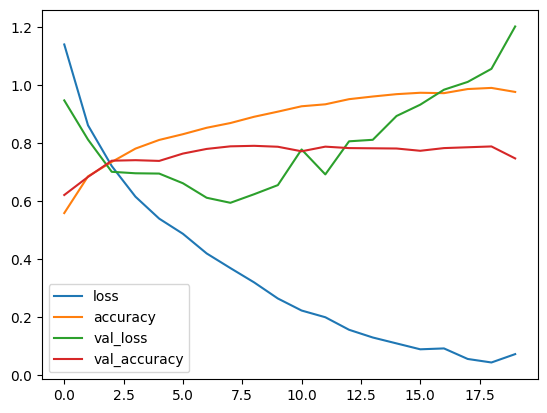

In [93]:
pd.DataFrame(history.history).plot()

In [94]:
pred = model.predict(test_images)

94/94 [==============================] - 2s 24ms/step


In [108]:
class_names[round(train_lables[10].numpy())]

'mountain'

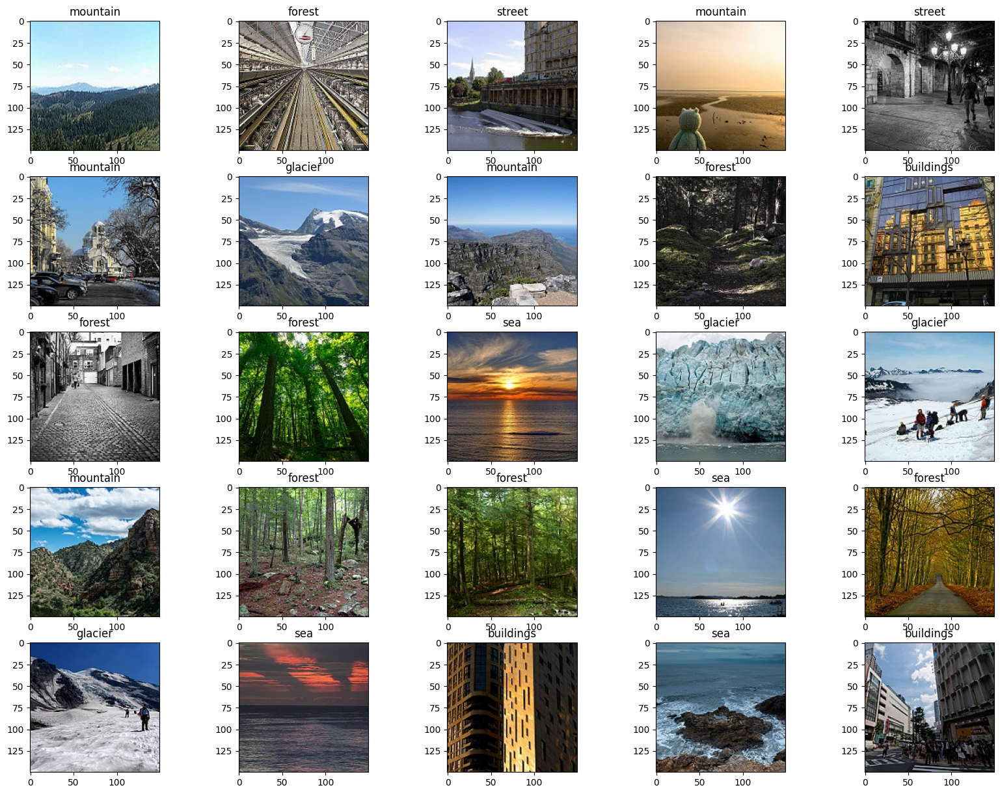

In [110]:
fig, axes = plt.subplots(5, 5, figsize=(20, 15))
axes = axes.ravel()
for idx, ax in enumerate(axes):
    ax.imshow(test_images[idx])
    #, color='r' if class_names[pred[idx].argmax()] != class_names[round(train_lables[idx].numpy())] else 'g'
    ax.set_title(class_names[pred[idx].argmax()])

plt.show()

In [130]:
pred_images_prediction = model.predict(pred_images)

48/48 [==============================] - 1s 24ms/step


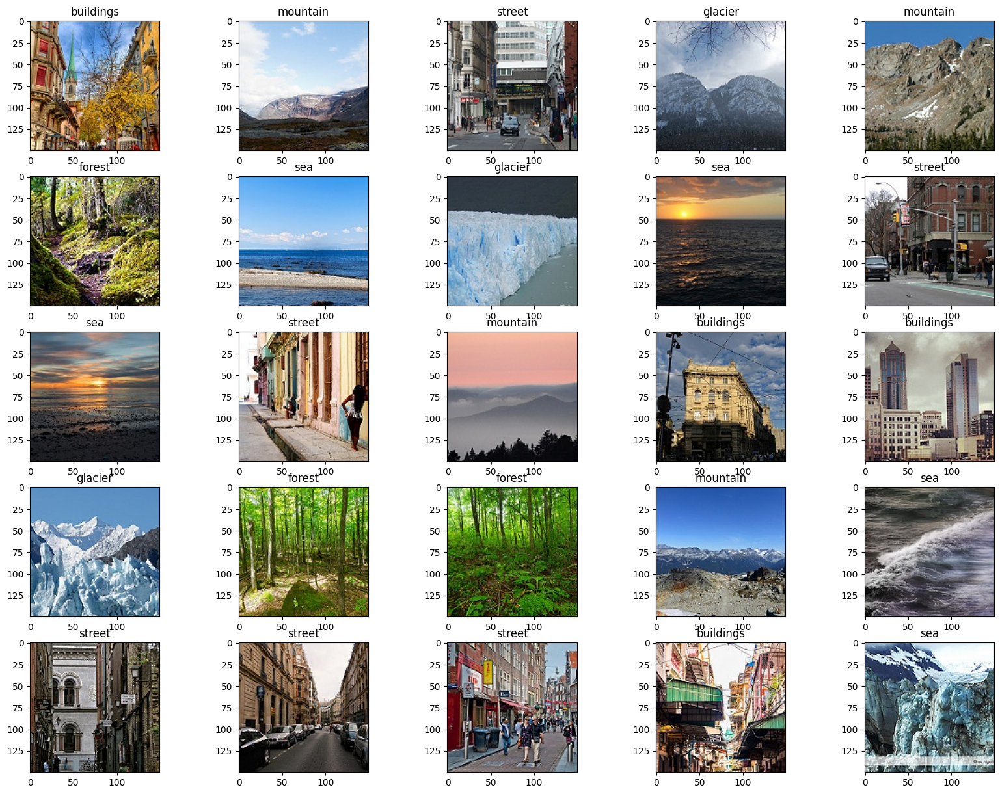

In [131]:
fig, axes = plt.subplots(5, 5, figsize=(20, 15))
axes = axes.ravel()
for idx, ax in enumerate(axes):
    ax.imshow(pred_images[idx])
    #, color='r' if class_names[pred[idx].argmax()] != class_names[round(train_lables[idx].numpy())] else 'g'
    ax.set_title(class_names[pred_images_prediction[idx].argmax()])

plt.show()